# Analysis Pipeline — Food-101 / SHViT vs Baselines

Runs the full analysis after all 6 models are trained. Everything stays on Colab's local SSD (`/content/`) so you can inspect outputs in the file browser. At the end, a single zip is created which you can download or copy to Drive.

**Before running:** `Runtime → Change runtime type → A100 GPU` (T4 also works, just slower for the eval step).

### What this notebook does
1. Mounts Drive (read-only access to checkpoints + dataset)
2. Copies dataset to local SSD for fast reads
3. Pulls the latest analysis scripts from your repo
4. Runs `eda.py`, `evaluate_all.py`, `make_figures.py`, `error_analysis.py`, `demo.py` in order
5. Inspects results and zips everything for download

## 0. GPU check

In [1]:
import torch
print('PyTorch :', torch.__version__)
print('CUDA    :', torch.cuda.is_available())
if torch.cuda.is_available():
    print('GPU     :', torch.cuda.get_device_name(0))

PyTorch : 2.11.0+cu128
CUDA    : True
GPU     : NVIDIA A100-SXM4-40GB


## 1. Mount Drive (read-only access to checkpoints + dataset source)

In [2]:
from google.colab import drive
drive.mount('/content/drive')

# Everything this notebook reads and writes lives under one root directory:
BASE_DIR = '/content/drive/MyDrive/CV_Research_Paper_Food101'

# Source paths on Drive (trained models + dataset, from Stages 2 & 3)
DRIVE_DATA      = f'{BASE_DIR}/food101_data'
DRIVE_BASELINES = f'{BASE_DIR}/Stage 2: baseline models'
DRIVE_SHVIT_FT  = f'{BASE_DIR}/Stage 3: fine-tuning SHViT'

# Analysis working paths — kept on local SSD, still under CV_Research_Paper_Food101
LOCAL_ROOT        = '/content/CV_Research_Paper_Food101/analysis'
LOCAL_DATA        = '/content/CV_Research_Paper_Food101/food101_data'
LOCAL_CHECKPOINTS = f'{LOCAL_ROOT}/checkpoints'
LOCAL_RESULTS     = f'{LOCAL_ROOT}/results'
LOCAL_FIGURES     = f'{LOCAL_ROOT}/figures'
LOCAL_EDA         = f'{LOCAL_ROOT}/eda_outputs'
LOCAL_ERROR       = f'{LOCAL_ROOT}/error_analysis_outputs'
LOCAL_DEMO        = f'{LOCAL_ROOT}/demo_output'

import os
for p in [LOCAL_ROOT, LOCAL_CHECKPOINTS, LOCAL_RESULTS, LOCAL_FIGURES,
          LOCAL_EDA, LOCAL_ERROR, LOCAL_DEMO]:
    os.makedirs(p, exist_ok=True)
print('Analysis root:', LOCAL_ROOT)

Mounted at /content/drive
Analysis root: /content/CV_Research_Paper_Food101/analysis


## 2. Copy dataset to local SSD

If `/content/CV_Research_Paper_Food101/food101_data` already exists from an earlier session, this skips the copy.

In [3]:
# ---------------------------------------------------------------------------
# Robust Food-101 setup.
#
# The freezes/crashes come from heavy I/O on the Google Drive FUSE mount:
# downloading + extracting + copying the 101,000 small Food-101 image files
# through Drive is extremely slow and routinely stalls / kills the runtime.
#
# Fix: do ALL extraction and every training read on the LOCAL SSD, and persist
# only the single ~5 GB tarball on Drive (Drive handles one big file fine).
# torchvision verifies the tarball's MD5, so a corrupt/partial download is
# re-fetched cleanly instead of crashing later.
# ---------------------------------------------------------------------------
import os, shutil, time, torchvision

SPLIT_ID = '1QK0tGi096I0Ba6kggatX1ee6dJFIcEJl'

def setup_food101(local_data, drive_data=None):
    """Prepare Food-101 on local SSD; persist only the single ~5 GB tarball on
    Drive. Avoids extracting/copying 101k small files over the Drive FUSE mount
    (the cause of the freezes/crashes). Returns the local data root."""
    os.makedirs(local_data, exist_ok=True)
    local_tgz = f'{local_data}/food-101.tar.gz'
    drive_tgz = f'{drive_data}/food-101.tar.gz' if drive_data else None

    def have_images(root):
        d = f'{root}/food-101/images'
        return os.path.isdir(d) and len(os.listdir(d)) == 101

    # 1) Seed the local tarball from the Drive cache (one big-file copy is far
    #    more reliable than copying the extracted 101k-file tree).
    if (not have_images(local_data) and not os.path.exists(local_tgz)
            and drive_tgz and os.path.exists(drive_tgz)):
        print('Restoring cached food-101.tar.gz from Drive ...')
        t0 = time.time(); shutil.copy(drive_tgz, local_tgz)
        print(f'  done in {time.time()-t0:.0f}s')

    # 2) Download (if needed) + MD5-verify + extract, all LOCALLY.
    print('Preparing Food-101 locally (download/verify/extract) ...')
    t0 = time.time()
    torchvision.datasets.Food101(root=local_data, split='train', download=True)
    torchvision.datasets.Food101(root=local_data, split='test',  download=True)
    print(f'  ready in {time.time()-t0:.0f}s')
    assert have_images(local_data), 'Food-101 not fully extracted'

    # 3) Cache the verified tarball back to Drive for future sessions.
    if drive_tgz and not os.path.exists(drive_tgz) and os.path.exists(local_tgz):
        os.makedirs(drive_data, exist_ok=True)
        print('Caching tarball to Drive (one big file) ...')
        t0 = time.time(); shutil.copy(local_tgz, drive_tgz)
        print(f'  cached in {time.time()-t0:.0f}s')

    # 4) Zhou split file -> local food-101 dir (cache on Drive too).
    split_path  = f'{local_data}/food-101/split_zhou_Food101.json'
    drive_split = f'{drive_data}/food-101/split_zhou_Food101.json' if drive_data else None
    if not os.path.exists(split_path):
        if drive_split and os.path.exists(drive_split):
            shutil.copy(drive_split, split_path)
        else:
            os.system('pip install -q gdown')
            os.system(f'gdown "https://drive.google.com/uc?id={SPLIT_ID}" -O "{split_path}"')
            if drive_split:
                os.makedirs(os.path.dirname(drive_split), exist_ok=True)
                shutil.copy(split_path, drive_split)
    assert os.path.exists(split_path), 'split_zhou_Food101.json missing'
    print('Zhou split present:', split_path)
    return local_data

LOCAL_DATA = setup_food101(LOCAL_DATA, DRIVE_DATA)
print('LOCAL_DATA now (local SSD):', LOCAL_DATA)

Restoring cached food-101.tar.gz from Drive ...
  done in 114s
Preparing Food-101 locally (download/verify/extract) ...
  ready in 56s
Zhou split present: /content/CV_Research_Paper_Food101/food101_data/food-101/split_zhou_Food101.json
LOCAL_DATA now (local SSD): /content/CV_Research_Paper_Food101/food101_data


## 3. Copy trained checkpoints from Drive to local

Symlinks would also work, but copies are safer and only ~300 MB total.

In [4]:
# Layout matches what evaluate_all.py expects:
#   <repo>/Stage 2: baseline models/<model>/best.pth
#   <repo>/Stage 3: fine-tuning SHViT/<model>/best.pth
STAGE2_LOCAL = f'{LOCAL_CHECKPOINTS}/Stage 2: baseline models'
STAGE3_LOCAL = f'{LOCAL_CHECKPOINTS}/Stage 3: fine-tuning SHViT'
os.makedirs(STAGE2_LOCAL, exist_ok=True)
os.makedirs(STAGE3_LOCAL, exist_ok=True)

for model in ['resnet50', 'mobilenet_v2']:
    src_dir = f'{DRIVE_BASELINES}/{model}'
    dst_dir = f'{STAGE2_LOCAL}/{model}'
    if os.path.isdir(src_dir) and not os.path.isdir(dst_dir):
        shutil.copytree(src_dir, dst_dir)
        print(f'copied {model}: {os.path.getsize(f"{dst_dir}/best.pth")/1e6:.1f} MB')
    elif os.path.isdir(dst_dir):
        print(f'{model}: already present')
    else:
        print(f'WARNING: {model} not found at {src_dir}')

for model in ['shvit_s1', 'shvit_s2', 'shvit_s3', 'shvit_s4']:
    src_dir = f'{DRIVE_SHVIT_FT}/{model}'
    dst_dir = f'{STAGE3_LOCAL}/{model}'
    if os.path.isdir(src_dir) and not os.path.isdir(dst_dir):
        shutil.copytree(src_dir, dst_dir)
        print(f'copied {model}: {os.path.getsize(f"{dst_dir}/best.pth")/1e6:.1f} MB')
    elif os.path.isdir(dst_dir):
        print(f'{model}: already present')
    else:
        print(f'WARNING: {model} not found at {src_dir}')

copied resnet50: 95.2 MB
copied mobilenet_v2: 9.6 MB
copied shvit_s1: 24.5 MB
copied shvit_s2: 44.7 MB
copied shvit_s3: 55.8 MB
copied shvit_s4: 65.3 MB


## 4. Clone repos and install dependencies

Pulls the latest analysis scripts from your branch. If the repo already exists, `git pull` updates it.

In [5]:
REPO_DIR  = '/content/Vision_Project_spring_26'
REPO_URL  = 'https://github.com/saif-farid-tech/Vision_Project_spring_26.git'
BRANCH    = 'Vision_Project_spring_26_Food101'
SHVIT_DIR = '/content/SHViT'

import os, shutil

if os.path.isdir(REPO_DIR):
    shutil.rmtree(REPO_DIR)

!git clone -b {BRANCH} {REPO_URL} {REPO_DIR}

if not os.path.isdir(SHVIT_DIR):
    !git clone https://github.com/ysj9909/SHViT.git {SHVIT_DIR}

# Copy analysis scripts to /content for clean invocation
for fname in ['eda.py', 'evaluate_all.py', 'make_figures.py',
              'error_analysis.py', 'demo.py',
              'augmentation.py', 'metrics.py', 'splits.py']:
    src = f'{REPO_DIR}/{fname}'
    if os.path.exists(src):
        shutil.copy(src, f'/content/{fname}')
        print(f'copied {fname}')
    else:
        print(f'MISSING: {fname} (push it to your branch first)')

# Copy the tip_datasets package (Tip-Adapter preprocessing + Zhou split loader).
if os.path.isdir('/content/tip_datasets'):
    shutil.rmtree('/content/tip_datasets')
shutil.copytree(f'{REPO_DIR}/tip_datasets', '/content/tip_datasets')
print('copied tip_datasets/')

Cloning into '/content/Vision_Project_spring_26'...
remote: Enumerating objects: 1223, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 1223 (delta 108), reused 109 (delta 97), pack-reused 1087 (from 3)
Receiving objects: 100% (1223/1223), 543.97 MiB | 17.62 MiB/s, done.
Resolving deltas: 100% (620/620), done.
Cloning into '/content/SHViT'...
remote: Enumerating objects: 183, done.
remote: Counting objects: 100% (183/183), done.
remote: Compressing objects: 100% (152/152), done.
remote: Total 183 (delta 84), reused 82 (delta 27), pack-reused 0 (from 0)
Receiving objects: 100% (183/183), 168.52 KiB | 1.83 MiB/s, done.
Resolving deltas: 100% (84/84), done.
copied eda.py
copied evaluate_all.py
copied make_figures.py
copied error_analysis.py
copied demo.py
copied augmentation.py
copied metrics.py
copied splits.py
copied tip_datasets/


In [6]:
# Dependencies: timm pinned, fvcore for GFLOPs, seaborn for heatmaps
!pip install -q timm==0.5.4 --no-deps
!pip install -q einops==0.4.1 easydict fvcore seaborn gdown
print('Deps installed.')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 431.5/431.5 kB 31.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
Deps installed.


## 5. EDA — sample grid, class distribution, image sizes

Quick (~2 min). No GPU needed.

In [7]:
!python /content/eda.py \
    --data-root  {LOCAL_DATA} \
    --output-dir {LOCAL_EDA}

print('\nEDA outputs:')
for f in sorted(os.listdir(LOCAL_EDA)):
    sz = os.path.getsize(f'{LOCAL_EDA}/{f}') / 1024
    print(f'  {f}  ({sz:.0f} KB)')

Reading split from /content/CV_Research_Paper_Food101/food101_data/food-101/split_zhou_Food101.json
Train: 50,500  Test: 30,300  Classes: 101
Wrote eda_samples.png
Wrote eda_image_sizes.png
Wrote eda_class_distribution.png
Wrote eda_summary.txt

EDA outputs:
  eda_class_distribution.png  (378 KB)
  eda_image_sizes.png  (98 KB)
  eda_samples.png  (11750 KB)
  eda_summary.txt  (2 KB)


## 6. Full evaluation + benchmarks on the test set

This is the big one — runs all 6 models on the official 25,250-image test set, plus parameter / FLOPs / throughput / latency benchmarks. ~30 min on A100.

In [8]:
!python /content/evaluate_all.py \
    --checkpoints-dir {LOCAL_CHECKPOINTS} \
    --shvit-dir       {SHVIT_DIR} \
    --data-root       {LOCAL_DATA} \
    --output-dir      {LOCAL_RESULTS}

print('\nResults outputs:')
for root, dirs, files in os.walk(LOCAL_RESULTS):
    for f in files:
        full = os.path.join(root, f)
        rel  = os.path.relpath(full, LOCAL_RESULTS)
        sz   = os.path.getsize(full) / 1024
        print(f'  {rel}  ({sz:.0f} KB)')

Device: cuda
Reading split from /content/CV_Research_Paper_Food101/food101_data/food-101/split_zhou_Food101.json
Reading split from /content/CV_Research_Paper_Food101/food101_data/food-101/split_zhou_Food101.json
Test set: 30,300 images

=== resnet50 ===
Evaluating on 30300 images...
  Batch 0/474
  Batch 50/474
  Batch 100/474
  Batch 150/474
  Batch 200/474
  Batch 250/474
  Batch 300/474
  Batch 350/474
  Batch 400/474
  Batch 450/474
Top-1: 79.78%  |  Top-5: 93.48%
  GPU throughput @bs64: 2909 img/s
  CPU latency @bs1   : 38.20 ms
  -> /content/CV_Research_Paper_Food101/analysis/results/resnet50/results.json

=== mobilenet_v2 ===
Evaluating on 30300 images...
  Batch 0/474
  Batch 50/474
  Batch 100/474
  Batch 150/474
  Batch 200/474
  Batch 250/474
  Batch 300/474
  Batch 350/474
  Batch 400/474
  Batch 450/474
Top-1: 72.65%  |  Top-5: 91.33%
  GPU throughput @bs64: 6556 img/s
  CPU latency @bs1   : 17.18 ms
  -> /content/CV_Research_Paper_Food101/analysis/results/mobilenet_v2/re

In [9]:
# Quick peek at the headline table
table_path = f'{LOCAL_RESULTS}/results_table.md'
if os.path.exists(table_path):
    with open(table_path) as f:
        print(f.read())

| Model | Params (M) | GFLOPs | Top-1 (%) | Top-5 (%) | GPU (img/s) | CPU (ms) |
|---|---|---|---|---|---|---|
| shvit_s1 | 6.04 | 0.24 | 65.50 | 86.28 | 4899 | 20.41 |
| mobilenet_v2 | 2.35 | 0.31 | 72.65 | 91.33 | 6556 | 17.18 |
| shvit_s2 | 11.08 | 0.37 | 68.07 | 87.54 | 4743 | 22.46 |
| shvit_s3 | 13.84 | 0.60 | 71.15 | 88.95 | 4439 | 25.16 |
| shvit_s4 | 16.18 | 0.79 | 71.19 | 89.03 | 3610 | 30.32 |
| resnet50 | 23.71 | 4.11 | 79.78 | 93.48 | 2909 | 38.20 |



## 7. Generate report figures

Reads training logs (from the checkpoint dirs) + `results.json` files. Produces the speed-vs-accuracy headline figure, training curves, train loss, accuracy bars.

In [10]:
!python /content/make_figures.py \
    --results-dir {LOCAL_RESULTS} \
    --logs-dir    {LOCAL_CHECKPOINTS} \
    --output-dir  {LOCAL_FIGURES}

print('\nFigures:')
for f in sorted(os.listdir(LOCAL_FIGURES)):
    sz = os.path.getsize(f'{LOCAL_FIGURES}/{f}') / 1024
    print(f'  {f}  ({sz:.0f} KB)')

Wrote /content/CV_Research_Paper_Food101/analysis/figures/fig_training_curves.png
Wrote /content/CV_Research_Paper_Food101/analysis/figures/fig_train_loss.png
Wrote /content/CV_Research_Paper_Food101/analysis/figures/fig_speed_vs_accuracy.png
Wrote /content/CV_Research_Paper_Food101/analysis/figures/fig_accuracy_bars.png

Figures:
  fig_accuracy_bars.png  (115 KB)
  fig_speed_vs_accuracy.png  (146 KB)
  fig_train_loss.png  (194 KB)
  fig_training_curves.png  (213 KB)


fig_speed_vs_accuracy.png


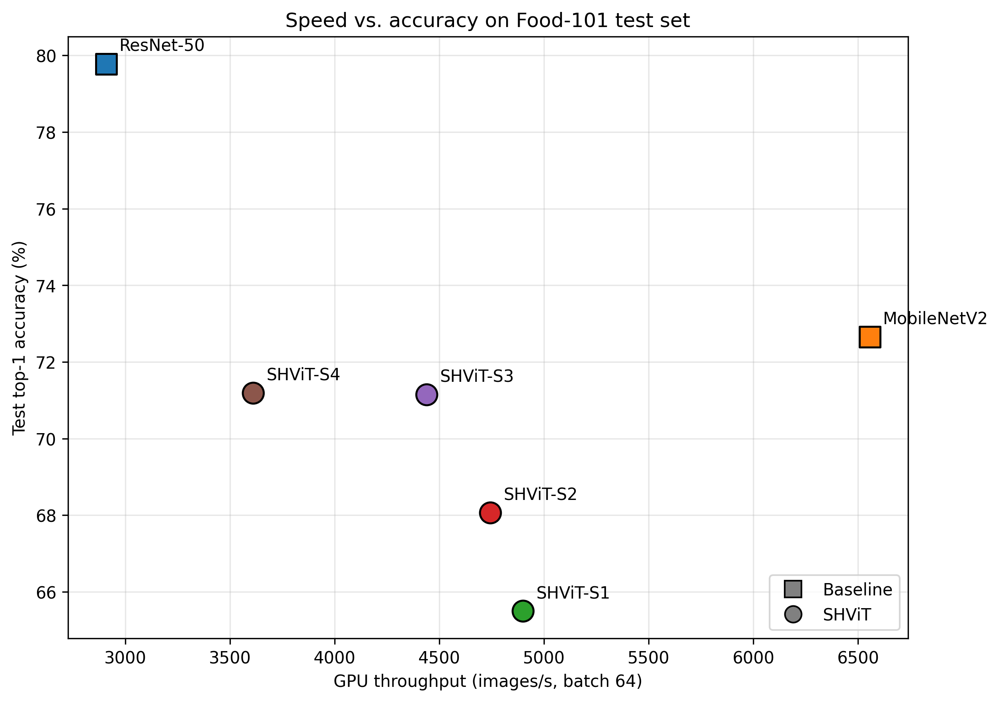

fig_training_curves.png


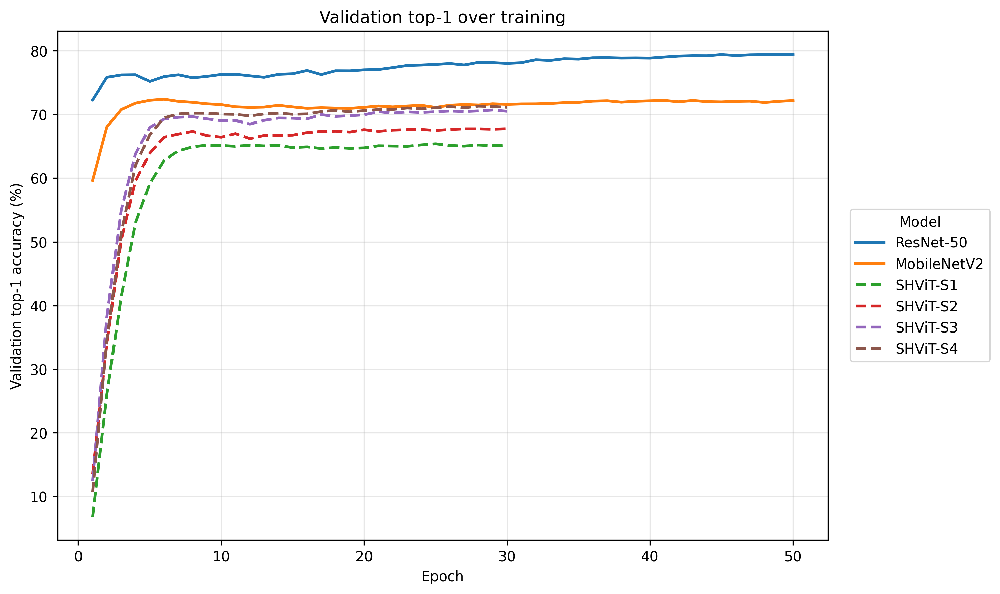

fig_accuracy_bars.png


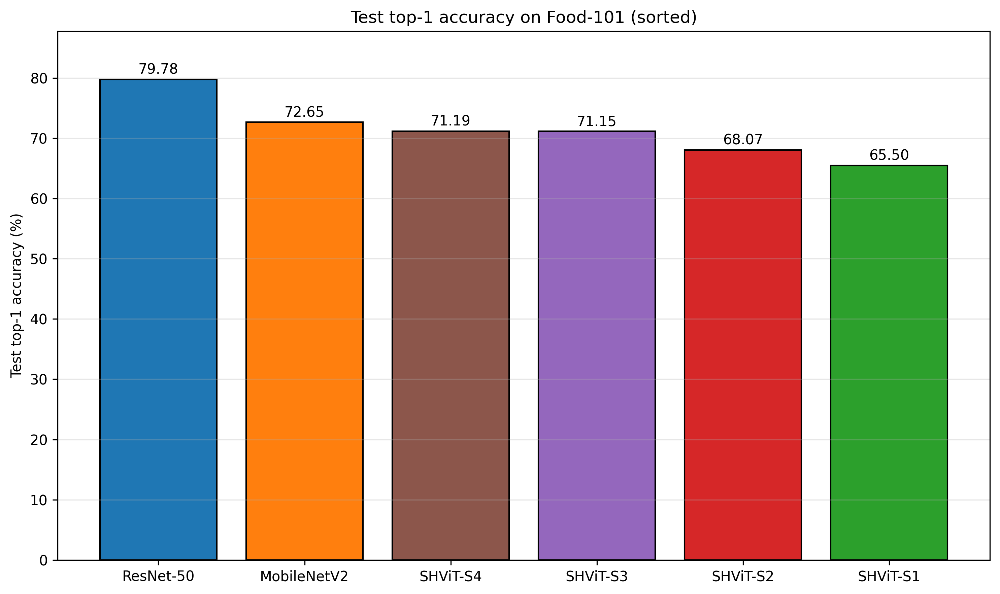

fig_train_loss.png


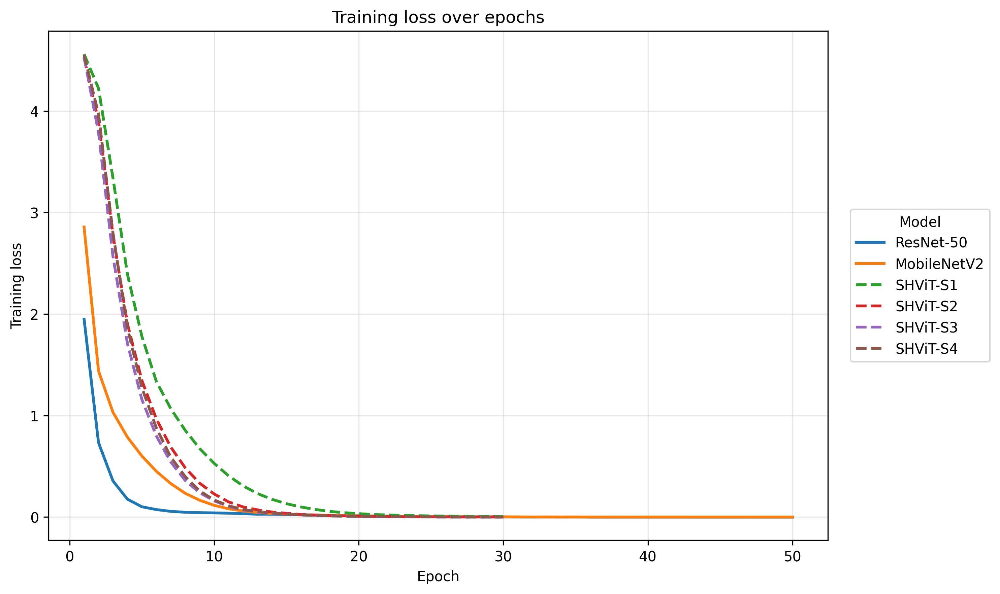

In [11]:
# Inline preview
from IPython.display import Image, display
for f in ['fig_speed_vs_accuracy.png', 'fig_training_curves.png',
          'fig_accuracy_bars.png', 'fig_train_loss.png']:
    p = f'{LOCAL_FIGURES}/{f}'
    if os.path.exists(p):
        print(f)
        display(Image(p, width=700))

## 8. Error analysis on SHViT-S4

Worst-15 categories, top-10 confused class pairs, confusion heatmap, misclassified image grid.

In [12]:
S4_CKPT = f'{STAGE3_LOCAL}/shvit_s4/best.pth'

!python /content/error_analysis.py \
    --results-dir {LOCAL_RESULTS} \
    --data-root   {LOCAL_DATA} \
    --shvit-dir   {SHVIT_DIR} \
    --checkpoint  "{S4_CKPT}" \
    --output-dir  {LOCAL_ERROR}

print('\nError analysis outputs:')
for f in sorted(os.listdir(LOCAL_ERROR)):
    sz = os.path.getsize(f'{LOCAL_ERROR}/{f}') / 1024
    print(f'  {f}  ({sz:.0f} KB)')

Reading split from /content/CV_Research_Paper_Food101/food101_data/food-101/split_zhou_Food101.json

Worst-10 classes:
  steak                         45.00%
  tuna_tartare                  46.33%
  foie_gras                     48.00%
  huevos_rancheros              48.33%
  pork_chop                     50.00%
  filet_mignon                  50.33%
  ravioli                       51.00%
  apple_pie                     51.00%
  cheesecake                    51.33%
  bread_pudding                 52.00%

Best-10 classes:
  edamame                       98.67%
  miso_soup                     91.33%
  pad_thai                      88.67%
  pho                           88.33%
  spaghetti_carbonara           88.33%
  hot_and_sour_soup             88.33%
  mussels                       88.00%
  oysters                       88.00%
  onion_rings                   87.33%
  seaweed_salad                 87.33%

Top-10 most confused class pairs (true -> predicted):
  filet_mignon              

confusion_top20.png


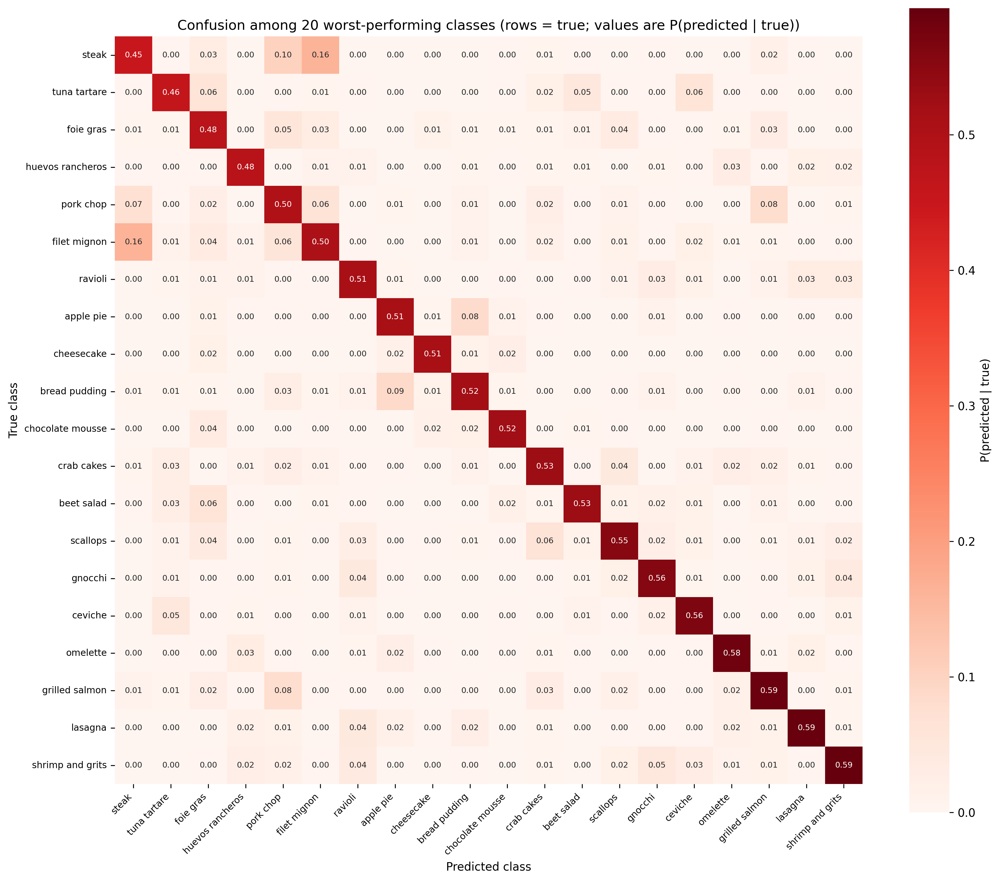

misclassified_grid.png


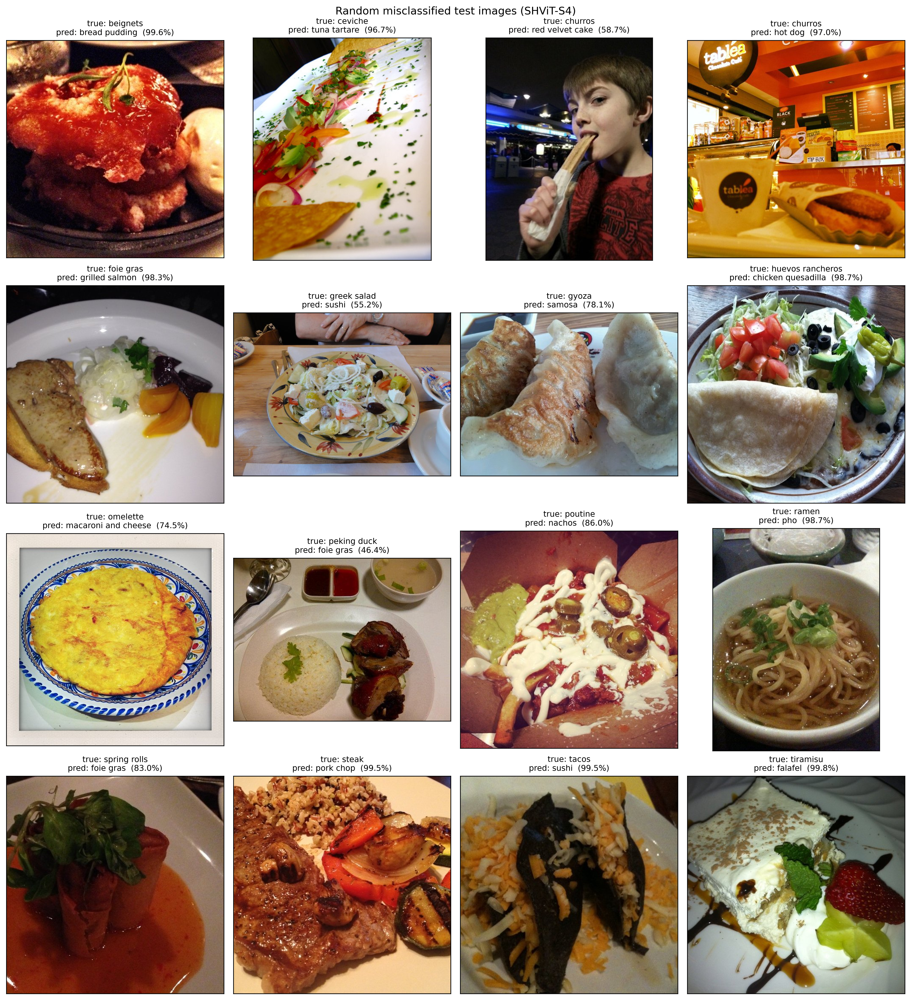

worst_15_categories.png


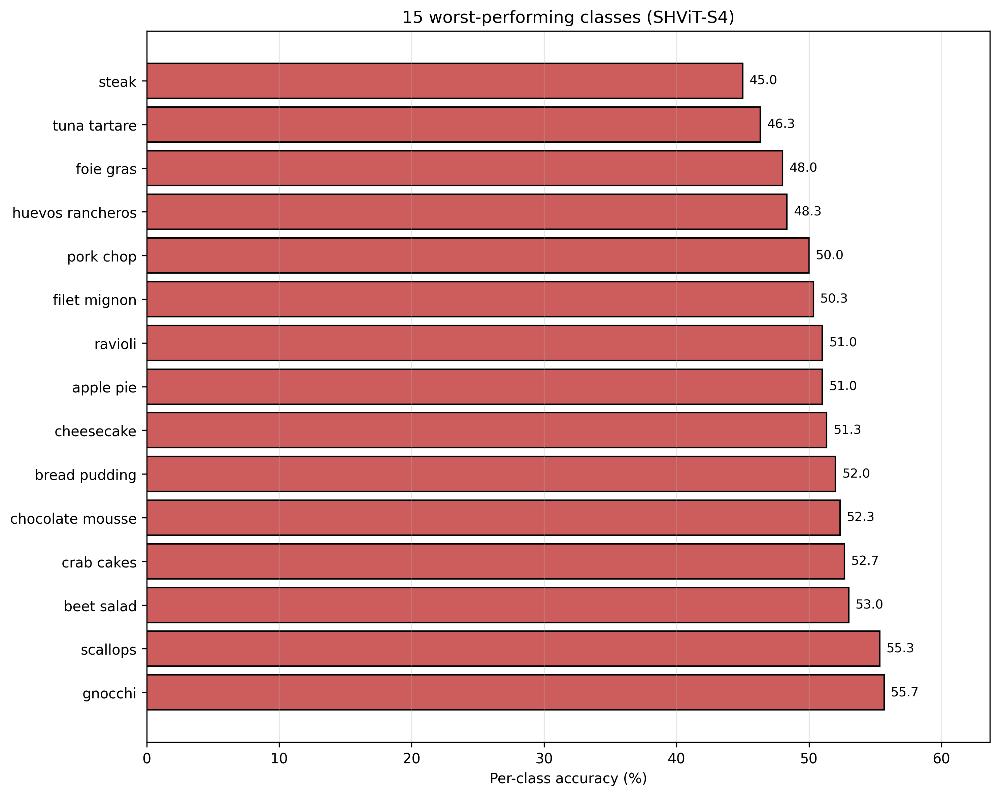

SHViT-S4 Error Analysis Summary

Overall:
  - Test set size       : 30,300 images
  - Test top-1 accuracy : 71.19%
  - Test top-5 accuracy : 89.03%

Worst-10 classes by per-class accuracy:
   1. steak                         45.00%
   2. tuna_tartare                  46.33%
   3. foie_gras                     48.00%
   4. huevos_rancheros              48.33%
   5. pork_chop                     50.00%
   6. filet_mignon                  50.33%
   7. ravioli                       51.00%
   8. apple_pie                     51.00%
   9. cheesecake                    51.33%
  10. bread_pudding                 52.00%

Best-10 classes (for context):
   1. edamame                       98.67%
   2. miso_soup                     91.33%
   3. pad_thai                      88.67%
   4. pho                           88.33%
   5. spaghetti_carbonara           88.33%
   6. hot_and_sour_soup             88.33%
   7. mussels                       88.00%
   8. oysters                       88.00%
   9.

In [13]:
# Inline preview of error figures + summary text
for f in ['confusion_top20.png', 'misclassified_grid.png', 'worst_15_categories.png']:
    p = f'{LOCAL_ERROR}/{f}'
    if os.path.exists(p):
        print(f)
        display(Image(p, width=700))

summary = f'{LOCAL_ERROR}/error_analysis_summary.txt'
if os.path.exists(summary):
    with open(summary) as f:
        print(f.read())

## 9. Demo on a single image

Smoke test for `demo.py`. Pick any test image — the path below grabs the first ceviche image.

Edit `DEMO_IMAGE` to try other foods.

Using image: /content/CV_Research_Paper_Food101/food101_data/food-101/images/sushi/100332.jpg
Device: cuda
Reading split from /content/CV_Research_Paper_Food101/food101_data/food-101/split_zhou_Food101.json

Top-5 predictions for 100332.jpg:
  1. sushi                        100.00%
  2. bruschetta                     0.00%
  3. caprese_salad                  0.00%
  4. scallops                       0.00%
  5. escargots                      0.00%

Saved /content/CV_Research_Paper_Food101/analysis/demo_output/demo_output.png


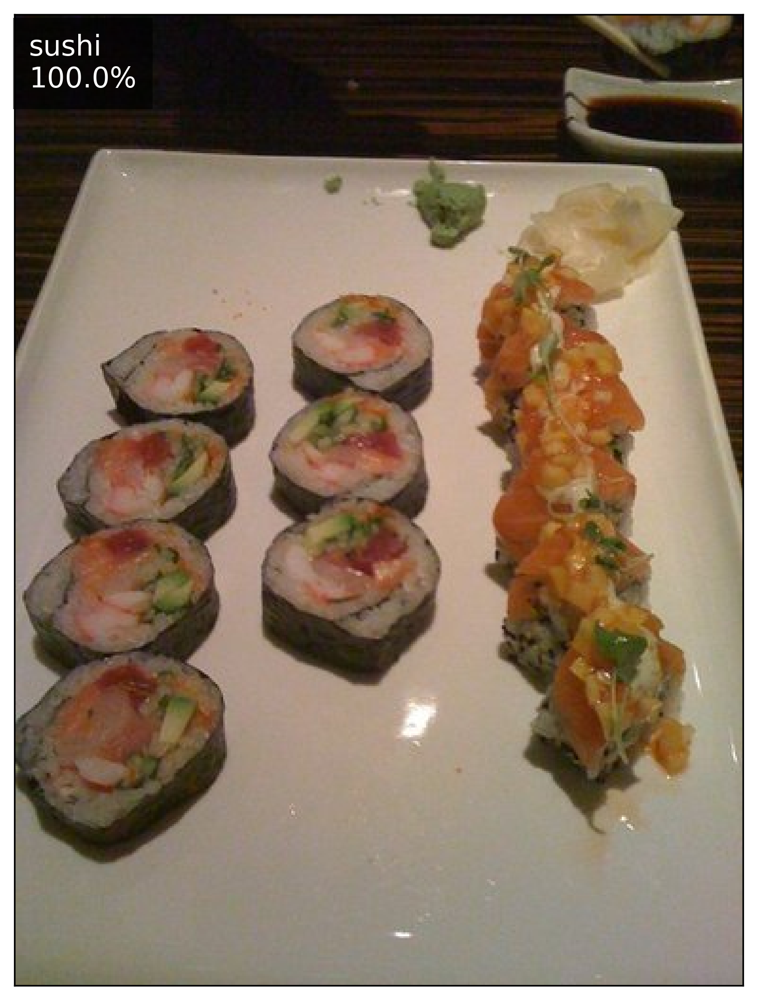

In [14]:
import glob
DEMO_IMAGE = sorted(glob.glob(f'{LOCAL_DATA}/food-101/images/sushi/*.jpg'))[0]
print('Using image:', DEMO_IMAGE)

DEMO_OUT = f'{LOCAL_DEMO}/demo_output.png'

!python /content/demo.py \
    --image       "{DEMO_IMAGE}" \
    --checkpoint  "{S4_CKPT}" \
    --shvit-dir   {SHVIT_DIR} \
    --data-root   {LOCAL_DATA} \
    --output      "{DEMO_OUT}"

if os.path.exists(DEMO_OUT):
    display(Image(DEMO_OUT, width=600))

## 10. Bundle everything for download

Zips the entire `/content/analysis/` folder so you can download it from the Colab file browser (right-click `analysis.zip` → Download). The zip excludes the local checkpoint copies (those are still on Drive).

In [15]:
ZIP_PATH = f'{LOCAL_ROOT}/CV_Research_Paper_Food101_analysis.zip'
if os.path.exists(ZIP_PATH):
    os.remove(ZIP_PATH)

# Zip results, figures, EDA, error analysis, demo — skip checkpoints (large + already on Drive)
!cd {LOCAL_ROOT} && zip -rq {ZIP_PATH} \
    results figures eda_outputs error_analysis_outputs demo_output

size_mb = os.path.getsize(ZIP_PATH) / 1e6
print(f'Bundle ready: {ZIP_PATH}  ({size_mb:.1f} MB)')
print('Right-click CV_Research_Paper_Food101_analysis.zip in the file browser to download.')

Bundle ready: /content/CV_Research_Paper_Food101/analysis/CV_Research_Paper_Food101_analysis.zip  (24.3 MB)
Right-click CV_Research_Paper_Food101_analysis.zip in the file browser to download.


In [16]:
# Copy the analysis bundle to Drive, under "Stage 4: Benchmarking and Demo/".
STAGE4_DRIVE = f'{BASE_DIR}/Stage 4: Benchmarking and Demo'
os.makedirs(STAGE4_DRIVE, exist_ok=True)
DRIVE_BUNDLE = f'{STAGE4_DRIVE}/CV_Research_Paper_Food101_analysis.zip'
shutil.copy(ZIP_PATH, DRIVE_BUNDLE)
print(f'Also saved to: {DRIVE_BUNDLE}')

Also saved to: /content/drive/MyDrive/CV_Research_Paper_Food101/Stage 4: Benchmarking and Demo/CV_Research_Paper_Food101_analysis.zip
